In [1]:
! [ -e /content ] && pip install -Uqq fastai

     |████████████████████████████████| 194kB 10.7MB/s 
     |████████████████████████████████| 51kB 7.5MB/s 


In [2]:
from fastai.vision.all import *

In [3]:
import numpy as np
import matplotlib.pyplot as plt
import os
import torch
import pathlib
import random

In [4]:
# Get the data for pets
path = untar_data('http://eve.kean.edu/~valentm3/Demo.tgz')

In [5]:
# Get the image files for each
files_dogs = get_image_files(path/'Test'/'Dogs')
files_cats = get_image_files(path/'Test'/'Cats')
files_misc = get_image_files(path/'Test'/'Misc')

In [6]:
# Function for preprocessing and scrambling
def scramble(files):
    indices = np.arange(4)
    for i in range(len(files)):
    
        # First grab the image, resize it and convery to numpy array
        img = np.array(PILImage.create(files[i]).resize((224,224)))
    
        # Grab data in cells, and save to list
        cells = []
        for row in range(2):
            for col in range(2):
                cells.append(img[row*112:(row+1)*112,col*112:(col+1)*112]) # No copy required, see NOTE
        
        # Get a permutation to shuffle the list by
        np.random.shuffle(indices)
        cells = np.array(cells)[indices] # NOTE: returns new, no copy above
    
        # Go back through, and update image
        for row in range(2):
            for col in range(2):
                img[row*112:(row+1)*112,col*112:(col+1)*112] = cells[row*2 + col]
    
        # Save filename as permutation used
        name = str(i) + '_' + '_'.join([str(c) for c in indices]) + '.jpg'
    
        # Convert back to image and overrite current file (with old name first)
        img = Image.fromarray(img)
        img.save(files[i])
    
        # Now rename with os in system, but first split string to get new name
        path_str = files[i].as_posix().split('/')
        new_path = '/'.join(path_str[:-1]) + '/' + name
        os.rename(files[i],new_path)
    
        # Finally, rename the path to match
        files[i] = files[i].with_name(name)

In [7]:
# Scramble all the files
scramble(files_dogs)
scramble(files_cats)
scramble(files_misc)

In [8]:
# Create function to unshuffle image given permutation
def unshuffle(x,mapping=None): # where x is just the Path object

    if mapping is None:
        
        # Get the name, has the label
        mapping = (x.name).split('_')[1:] # Exclude number
        mapping[-1] = mapping[-1][:-4] # get rid of .jpg for last
        mapping = np.array(mapping,np.int)

    # Grab image, and turn into a numpy array 
    if type(x) == pathlib.PosixPath:
        img = np.array(PILImage.create(x))
    else:
        img = np.array(x)

    # Go through, and add data where it goes in array
    cells = [None]*4
    for row in range(2):
        for col in range(2):
            cells[mapping[row*2 + col]] = img[row*112:(row+1)*112,col*112:(col+1)*112].copy() # Must copy

    # Second pass through, repopulate the img correctly
    for row in range(2):
        for col in range(2):
            img[row*112:(row+1)*112,col*112:(col+1)*112] = cells[row*2+col]
    
    # Turn back into image, and return
    return Image.fromarray(img)

In [9]:
# Real label function
def label_func(x):

    # Grab all the numbers in an array
    mapping = (x.name).split('_')[1:] # Exclude number
    mapping[-1] = mapping[-1][:-4] # get rid of .jpg for last
    mapping = np.array(mapping,np.int)

    # Spread out values evenly, give enough space for landscape
    vals = np.array([-75,-25,25,75])
    retval = np.zeros(4)
    for i,idx in enumerate(mapping):
        retval[idx] = vals[i]
    return retval

In [10]:
# Download learner file
model = get_files(path/'Models')[0]

# Load the learner that was trained
learn = load_learner(model)

In [11]:
# Get the number of correct
def get_correct(files):
    correct = 0
    total = len(files)
    for file in files:
        output = np.argsort(learn.predict(file)[2]).numpy()
        target = np.argsort(label_func(file))
        correct += 1 if (output == target).all() else 0

    return correct/total*100

In [12]:
# Display all results
def sidebyside(files):
    row,col = len(files),2
    fig,axs = subplots(row,col)
    for i,file in enumerate(files):
        input = PILImage.create(file)
        output = unshuffle(input,np.argsort(learn.predict(input)[2]).numpy())
        axs[i][0].imshow(input)
        axs[i][1].imshow(output)
        axs[i][0].axes.xaxis.set_visible(False)
        axs[i][0].axes.yaxis.set_visible(False)
        axs[i][1].axes.xaxis.set_visible(False)
        axs[i][1].axes.yaxis.set_visible(False)
    
    plt.show()

# Dogs

In [13]:
print('Percentage of correct Dogs: ',get_correct(files_dogs))

Percentage of correct Dogs:  92.0


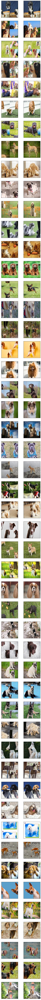

In [14]:
sidebyside(files_dogs)

# Cats




In [15]:
print('Percentage of correct Cats: ',get_correct(files_cats))

Percentage of correct Cats:  94.0


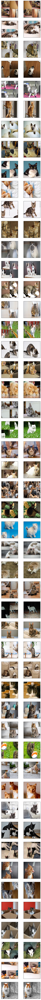

In [16]:
sidebyside(files_cats)

# Misc

In [17]:
print('Percentage of correct Misc: ',get_correct(files_misc))

Percentage of correct Misc:  88.0


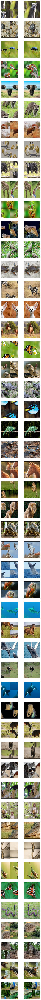

In [18]:
sidebyside(files_misc)